# Problem statement
Sub-Task 1:

Clean the data – you might have to address missing values, duplicates, data type conversions, transformations, and multicolinearity, as well as outliers.

Sub-Task 2:

Perform some exploratory data analysis. Look into the data types, data statistics, and identify any missing data or null values, and how often they appear in the data. Visualize specific parameters as well as variable distributions.

In [68]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno
#import pandas_profiling as profile_report 
import matplotlib.pyplot as plt


In [69]:
# Set maximum number of columns to be displayed
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [70]:
training_data = pd.read_csv('ml_case_training_data.csv')
training_data_history = pd.read_csv('ml_case_training_hist_data.csv')
training_output = pd.read_csv('ml_case_training_output.csv')

In [71]:
training_data.head()

,id,activity_new,campaign_disc_ele,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,date_renewal,forecast_base_bill_ele,forecast_base_bill_year,forecast_bill_12m,forecast_cons,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,NaN,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,NaN,2012-11-07,2015-11-09,NaN,NaN,NaN,NaN,26520.30,10025,0.0,359.29,0.095919,0.088347,58.995952,f,831.8,-41.76,-41.76,1,1732.36,3,ldkssxwpmemidmecebumciepifcamkci,180.000
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,NaN,NaN,2015-06-23,NaN,NaN,NaN,NaN,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.0,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,NaN,NaN,4660,0,0,2009-08-21,2016-08-30,NaN,2009-08-21,2015-08-31,NaN,NaN,NaN,NaN,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.0,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800
3,764c75f661154dac3a6c254cd082ea7d,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,NaN,2010-04-16,2015-04-17,NaN,NaN,NaN,NaN,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.0,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856
4,bba03439a292a1e166f80264c16191cb,NaN,NaN,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,NaN,2010-03-30,2015-03-31,NaN,NaN,NaN,NaN,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.0,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200


In [72]:
training_data_history.head()

,id,price_date,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix
0,038af19179925da21a25619c5a24b745,2015-01-01,0.151367,0.0,0.0,44.266931,0.0,0.0
1,038af19179925da21a25619c5a24b745,2015-02-01,0.151367,0.0,0.0,44.266931,0.0,0.0
2,038af19179925da21a25619c5a24b745,2015-03-01,0.151367,0.0,0.0,44.266931,0.0,0.0
3,038af19179925da21a25619c5a24b745,2015-04-01,0.149626,0.0,0.0,44.266931,0.0,0.0
4,038af19179925da21a25619c5a24b745,2015-05-01,0.149626,0.0,0.0,44.266931,0.0,0.0


In [90]:
f = training_data_history.groupby('id')['price_date'].count()
f

id
0002203ffbb812588b632b9e628cc38d    12
0004351ebdd665e6ee664792efc4fd13    12
0010bcc39e42b3c2131ed2ce55246e3c    12
0010ee3855fdea87602a5b7aba8e42de    12
00114d74e963e47177db89bc70108537    12
                                    ..
ffef185810e44254c3a4c6395e6b4d8a    12
fffac626da707b1b5ab11e8431a4d0a2    12
fffc0cacd305dd51f316424bbb08d1bd    12
fffe4f5646aa39c7f97f95ae2679ce64    12
ffff7fa066f1fb305ae285bb03bf325a    12
Name: price_date, Length: 16096, dtype: int64

In [91]:
grouped = training_data_history.groupby('id').sum()   #.sort_values(ascending = True)

In [93]:
grouped['Price_date Count'] = f.values

In [94]:
grouped.head()

,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count
id,,,,,,,
0002203ffbb812588b632b9e628cc38d,1.492061,1.245525,0.877924,488.420789,293.052462,195.368327,12
0004351ebdd665e6ee664792efc4fd13,1.757118,0.000000,0.000000,532.625404,0.000000,0.000000,12
0010bcc39e42b3c2131ed2ce55246e3c,2.178702,0.000000,0.000000,543.836520,0.000000,0.000000,12
0010ee3855fdea87602a5b7aba8e42de,1.425085,1.179509,0.828384,487.769130,292.661462,195.107656,12
00114d74e963e47177db89bc70108537,1.775110,0.000000,0.000000,531.203164,0.000000,0.000000,12


In [96]:
columns = ['price_p2_var', 'price_p3_var', 'price_p1_fix', 'price_p2_fix', 'price_p3_fix']
for col in columns:
    grouped[col + 'Purchase'] = grouped[col].apply(lambda x: 1 if x != 0 else 0)

In [97]:
grouped.head()

,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase
id,,,,,,,,,,,,
0002203ffbb812588b632b9e628cc38d,1.492061,1.245525,0.877924,488.420789,293.052462,195.368327,12,1,1,1,1,1
0004351ebdd665e6ee664792efc4fd13,1.757118,0.000000,0.000000,532.625404,0.000000,0.000000,12,0,0,1,0,0
0010bcc39e42b3c2131ed2ce55246e3c,2.178702,0.000000,0.000000,543.836520,0.000000,0.000000,12,0,0,1,0,0
0010ee3855fdea87602a5b7aba8e42de,1.425085,1.179509,0.828384,487.769130,292.661462,195.107656,12,1,1,1,1,1
00114d74e963e47177db89bc70108537,1.775110,0.000000,0.000000,531.203164,0.000000,0.000000,12,0,0,1,0,0


In [75]:
plt.plot([0,1,2,3,4,5,6,7,8,9,10,11], training_data_history[training_data_history['id'] == '7168f3983ace3e295e97db8a11fc9998']['price_p2_fix'].values)
(plt.show()
#train#ing_data_history[training_data_history['id'] == '48f3e6ed3434c3c1e2056d1a313e2671815e4dice_p1_fix'].values).plot(kind ='line', x = [0,1,2,3,4,5,6,7,8,9,10,11,12])

SyntaxError: unexpected EOF while parsing (<ipython-input-75-d1b407e5934f>, line 3)

In [99]:
training_data.info()
training_data_history.info()
training_output.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16096 entries, 0 to 16095
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   campaign_disc_ele         0 non-null      float64
 3   channel_sales             11878 non-null  object 
 4   cons_12m                  16096 non-null  int64  
 5   cons_gas_12m              16096 non-null  int64  
 6   cons_last_month           16096 non-null  int64  
 7   date_activ                16096 non-null  object 
 8   date_end                  16094 non-null  object 
 9   date_first_activ          3508 non-null   object 
 10  date_modif_prod           15939 non-null  object 
 11  date_renewal              16056 non-null  object 
 12  forecast_base_bill_ele    3508 non-null   float64
 13  forecast_base_bill_year   3508 non-null   float64
 14  foreca

In [109]:
all_data = training_data.merge(grouped, on= 'id')

In [107]:
all_data.head(20)

,id,activity_new,campaign_disc_ele,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,date_renewal,forecast_base_bill_ele,forecast_base_bill_year,forecast_bill_12m,forecast_cons,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,NaN,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,NaN,2012-11-07,2015-11-09,NaN,NaN,NaN,NaN,26520.30,10025,0.0,359.29,0.095919,0.088347,58.995952,f,831.80,-41.76,-41.76,1,1732.36,3,ldkssxwpmemidmecebumciepifcamkci,180.000,1.241384,1.105379,0.806894,707.478018,436.282646,100.044610,12,1,1,1,1,1
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,NaN,NaN,2015-06-23,NaN,NaN,NaN,NaN,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.00,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1.351412,1.123509,0.798365,447.040256,268.224124,178.816084,12,1,1,1,1,1
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,NaN,NaN,4660,0,0,2009-08-21,2016-08-30,NaN,2009-08-21,2015-08-31,NaN,NaN,NaN,NaN,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.00,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,1.649274,0.000000,0.000000,487.469573,0.000000,0.000000,12,0,0,1,0,0
3,764c75f661154dac3a6c254cd082ea7d,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,NaN,2010-04-16,2015-04-17,NaN,NaN,NaN,NaN,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.00,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,2.046140,1.061055,0.000000,532.625404,0.000000,0.000000,12,1,0,1,0,0
4,bba03439a292a1e166f80264c16191cb,NaN,NaN,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,NaN,2010-03-30,2015-03-31,NaN,NaN,NaN,NaN,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.00,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,1.814521,0.000000,0.000000,532.803183,0.000000,0.000000,12,0,0,1,0,0
5,568bb38a1afd7c0fc49c77b3789b59a3,sfisfxfcocfpcmckuekokxuseixdaoeu,NaN,foosdfpfkusacimwkcsosbicdxkicaua,121335,0,12400,2010-04-08,2016-04-08,2010-04-08,2010-04-08,2015-04-12,1399.83,1399.83,14559.74,1052.37,10865.02,12400,0.0,170.74,0.110083,0.093746,40.606701,f,1052.37,-3.18,-3.18,1,823.18,6,lxidpiddsbxsbosboudacockeimpuepw,75.000,1.421371,1.177607,0.830018,488.094958,292.856963,195.237995,12,1,1,1,1,1
6,149d57cf92fc41cf94415803a877cb4b,NaN,NaN,NaN,4425,0,526,2010-01-13,2016-03-07,NaN,2010-01-13,2015-03-09,NaN,NaN,NaN,NaN,445.75,526,0.0,131.73,0.116900,0.100015,40.606701,f,52.32,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,1.490092,1.243658,0.874383,488.257873,292.954712,195.303161,12,1,1,1,1,1
7,1aa498825382410b098937d65c4ec26d,NaN,NaN,usilxuppasemubllopkaafesmlibmsdf,8302,0,1998,2011-12-09,2016-12-09,2011-12-09,2015-11-01,2015-12-10,290.10,290.10,1412.54,181.21,796.94,1998,0.0,30.12,0.164775,0.086131,45.308378,f,181.21,33.12,33.12,1,118.89,4,lxidpiddsbxsbosboudacockeimpuepw,13.200,2.027435,1.051590,0.000000,531.203166,0.000000,0.000000,12,1,0,1,0,0
8,7ab4bf4878d8f7661dfc20e9b8e18011,sscfoipxikopfskekuobeuxkxmwsuucb,NaN,foosdfpfkusacimwkcsosbicdxkicaua,45097,0,0,2011-12-02,2016-12-02,NaN,2011-12-02,2015-12-03,NaN,NaN,NaN,NaN,8069.28,0,0.0,0.00,0.166178,0.087538,44.311378,f,0.00,4.04,4.04,1,346.63,4,lxidpiddsbxsbosboudacockeimpuepw,15.000,1.992728,1.016931,0.000000,531.203160,0.000000,0.000000,12,1,0,1,0,0
9,01495c955be7ec5e7f3203406785aae0,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,29552,0,1260,2010-04-21,2016-04-21,2010-04-21,2010-04-21,2015-04-22,248.79,248.79,27

In [110]:
all_data = all_data.merge(training_output, on='id')

In [111]:
all_data.head()

,id,activity_new,campaign_disc_ele,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,date_renewal,forecast_base_bill_ele,forecast_base_bill_year,forecast_bill_12m,forecast_cons,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase,churn
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,NaN,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,NaN,2012-11-07,2015-11-09,NaN,NaN,NaN,NaN,26520.30,10025,0.0,359.29,0.095919,0.088347,58.995952,f,831.8,-41.76,-41.76,1,1732.36,3,ldkssxwpmemidmecebumciepifcamkci,180.000,1.241384,1.105379,0.806894,707.478018,436.282646,100.044610,12,1,1,1,1,1,0
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,NaN,NaN,2015-06-23,NaN,NaN,NaN,NaN,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.0,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1.351412,1.123509,0.798365,447.040256,268.224124,178.816084,12,1,1,1,1,1,1
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,NaN,NaN,4660,0,0,2009-08-21,2016-08-30,NaN,2009-08-21,2015-08-31,NaN,NaN,NaN,NaN,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.0,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,1.649274,0.000000,0.000000,487.469573,0.000000,0.000000,12,0,0,1,0,0,0
3,764c75f661154dac3a6c254cd082ea7d,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,NaN,2010-04-16,2015-04-17,NaN,NaN,NaN,NaN,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.0,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,2.046140,1.061055,0.000000,532.625404,0.000000,0.000000,12,1,0,1,0,0,0
4,bba03439a292a1e166f80264c16191cb,NaN,NaN,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,NaN,2010-03-30,2015-03-31,NaN,NaN,NaN,NaN,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.0,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,1.814521,0.000000,0.000000,532.803183,0.000000,0.000000,12,0,0,1,0,0,0


In [112]:
all_data.tail()

,id,activity_new,campaign_disc_ele,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,date_renewal,forecast_base_bill_ele,forecast_base_bill_year,forecast_bill_12m,forecast_cons,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase,churn
16091,18463073fb097fc0ac5d3e040f356987,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,32270,47940,0,2012-05-24,2016-05-08,NaN,2015-05-08,2014-05-26,NaN,NaN,NaN,NaN,4648.01,0,0.0,18.57,0.138305,0.000000,44.311378,t,0.00,27.88,27.88,2,381.77,4,lxidpiddsbxsbosboudacockeimpuepw,15.000,1.729493,0.000000,0.000000,532.447624,0.000000,0.000000,12,0,0,1,0,0,0
16092,d0a6f71671571ed83b2645d23af6de00,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,7223,0,181,2012-08-27,2016-08-27,2012-08-27,2012-08-27,2015-08-28,68.64,68.64,1254.65,15.94,631.69,181,0.0,144.03,0.100167,0.091892,58.995952,f,15.94,0.00,0.00,1,90.34,3,lxidpiddsbxsbosboudacockeimpuepw,6.000,1.281589,1.144873,0.849800,708.188082,436.720550,100.145014,12,1,1,1,1,1,1
16093,10e6828ddd62cbcf687cb74928c4c2d2,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,1844,0,179,2012-02-08,2016-02-07,NaN,2012-02-08,2015-02-09,NaN,NaN,NaN,NaN,190.39,179,0.0,129.60,0.116900,0.100015,40.606701,f,18.05,39.84,39.84,1,20.38,4,lxidpiddsbxsbosboudacockeimpuepw,15.935,1.492061,1.245525,0.877924,488.420789,293.052462,195.368327,12,1,1,1,1,1,1
16094,1cf20fd6206d7678d5bcafd28c53b4db,NaN,NaN,foosdfpfkusacimwkcsosbicdxkicaua,131,0,0,2012-08-30,2016-08-30,NaN,2012-08-30,2015-08-31,NaN,NaN,NaN,NaN,19.34,0,0.0,7.18,0.145711,0.000000,44.311378,f,0.00,13.08,13.08,1,0.96,3,lxidpiddsbxsbosboudacockeimpuepw,11.000,1.649274,0.000000,0.000000,487.469574,0.000000,0.000000,12,0,0,1,0,0,0
16095,563dde550fd624d7352f3de77c0cdfcd,NaN,NaN,NaN,8730,0,0,2009-12-18,2016-12-17,NaN,2009-12-18,2015-12-21,NaN,NaN,NaN,NaN,762.41,0,0.0,1.07,0.167086,0.088454,45.311378,f,0.00,11.84,11.84,1,96.34,6,ldkssxwpmemidmecebumciepifcamkci,10.392,2.023940,1.048131,0.000000,531.203166,0.000000,0.000000,12,1,0,1,0,0,0


In [113]:
#checking the info of the new data
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   campaign_disc_ele         0 non-null      float64
 3   channel_sales             11878 non-null  object 
 4   cons_12m                  16096 non-null  int64  
 5   cons_gas_12m              16096 non-null  int64  
 6   cons_last_month           16096 non-null  int64  
 7   date_activ                16096 non-null  object 
 8   date_end                  16094 non-null  object 
 9   date_first_activ          3508 non-null   object 
 10  date_modif_prod           15939 non-null  object 
 11  date_renewal              16056 non-null  object 
 12  forecast_base_bill_ele    3508 non-null   float64
 13  forecast_base_bill_year   3508 non-null   float64
 14  foreca

In [114]:
all_data.columns

Index(['id', 'activity_new', 'campaign_disc_ele', 'channel_sales', 'cons_12m',
       'cons_gas_12m', 'cons_last_month', 'date_activ', 'date_end',
       'date_first_activ', 'date_modif_prod', 'date_renewal',
       'forecast_base_bill_ele', 'forecast_base_bill_year',
       'forecast_bill_12m', 'forecast_cons', 'forecast_cons_12m',
       'forecast_cons_year', 'forecast_discount_energy',
       'forecast_meter_rent_12m', 'forecast_price_energy_p1',
       'forecast_price_energy_p2', 'forecast_price_pow_p1', 'has_gas',
       'imp_cons', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'nb_prod_act',
       'net_margin', 'num_years_antig', 'origin_up', 'pow_max', 'price_p1_var',
       'price_p2_var', 'price_p3_var', 'price_p1_fix', 'price_p2_fix',
       'price_p3_fix', 'Price_date Count', 'price_p2_varPurchase',
       'price_p3_varPurchase', 'price_p1_fixPurchase', 'price_p2_fixPurchase',
       'price_p3_fixPurchase', 'churn'],
      dtype='object')

In [115]:
all_data = all_data.drop_duplicates(subset='id')
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   campaign_disc_ele         0 non-null      float64
 3   channel_sales             11878 non-null  object 
 4   cons_12m                  16096 non-null  int64  
 5   cons_gas_12m              16096 non-null  int64  
 6   cons_last_month           16096 non-null  int64  
 7   date_activ                16096 non-null  object 
 8   date_end                  16094 non-null  object 
 9   date_first_activ          3508 non-null   object 
 10  date_modif_prod           15939 non-null  object 
 11  date_renewal              16056 non-null  object 
 12  forecast_base_bill_ele    3508 non-null   float64
 13  forecast_base_bill_year   3508 non-null   float64
 14  foreca

In [116]:
all_data.describe()

,campaign_disc_ele,cons_12m,cons_gas_12m,cons_last_month,forecast_base_bill_ele,forecast_base_bill_year,forecast_bill_12m,forecast_cons,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase,churn
count,0.0,1.609600e+04,1.609600e+04,1.609600e+04,3508.000000,3508.000000,3508.000000,3508.000000,16096.000000,16096.000000,15970.000000,16096.000000,15970.000000,15970.000000,15970.000000,16096.000000,16083.000000,16083.000000,16096.000000,16081.000000,16096.000000,16093.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000,16096.000000
mean,NaN,1.948044e+05,3.191164e+04,1.946154e+04,335.843857,335.843857,3837.441866,206.845165,2370.555949,1907.347229,0.991547,70.309945,0.135901,0.052951,43.533496,196.123447,22.462276,21.460318,1.347788,217.987028,5.030629,20.604131,1.678680,0.647838,0.365668,515.844784,127.375453,76.860041,11.990681,0.549453,0.421161,0.992483,0.420353,0.420353,0.099093
std,NaN,6.795151e+05,1.775885e+05,8.235676e+04,649.406000,649.406000,5425.744327,455.634288,4035.085664,5257.364759,5.160969,79.023251,0.026252,0.048617,5.212252,494.366979,23.700883,27.917349,1.459808,366.742030,1.676101,21.772421,0.293703,0.594612,0.431840,65.795636,152.933547,92.552422,0.137117,0.497564,0.493761,0.086379,0.493631,0.493631,0.298796
min,NaN,-1.252760e+05,-3.037000e+03,-9.138600e+04,-364.940000,-364.940000,-2503.480000,0.000000,-16689.260000,-85627.000000,0.000000,-242.960000,0.000000,0.000000,-0.122184,-9038.210000,-525.540000,-615.660000,1.000000,-4148.990000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,5.906250e+03,0.000000e+00,0.000000e+00,0.000000,0.000000,1158.175000,0.000000,513.230000,0.000000,0.000000,16.230000,0.115237,0.000000,40.606701,0.000000,11.960000,11.950000,1.000000,51.970000,4.000000,12.500000,1.486491,0.000000,0.000000,487.932042,0.000000,0.000000,12.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,NaN,1.533250e+04,0.000000e+00,9.010000e+02,162.955000,162.955000,2187.230000,42.215000,1179.160000,378.000000,0.000000,19.440000,0.142881,0.086163,44.311378,44.465000,21.090000,20.970000,1.000000,119.680000,5.000000,13.856000,1.757582,1.024101,0.000000,531.203166,0.000000,0.000000,12.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,NaN,5.022150e+04,0.000000e+00,4.127000e+03,396.185000,396.185000,4246.555000,228.117500,2692.077500,1994.250000,0.000000,131.470000,0.146348,0.098837,44.311378,218.090000,29.640000,29.640000,1.000000,275.810000,6.000000,19.800000,1.800112,1.226935,0.870298,532.447623,292.661462,194.977312,12.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
max,NaN,1.609711e+07,4.188440e+06,4.538720e+06,12566.080000,12566.080000,81122.630000,9682.890000,103801.930000,175375.000000,50.000000,2411.690000,0.273963,0.195975,59.444710,15042.790000,374.640000,374.640000,32.000000,24570.650000,16.000000,500.000000,3.345105,2.355302,1.235418,713.336520,437.888298,201.827009,12.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


The description shows that the data is skewed (std), has negative values in consumption column, and  has NAN 

In [118]:
#checking for missen data in percentage
{'Missing records (%)':all_data.isnull().sum()/len(all_data)*100}

{'Missing records (%)': id                            0.000000
 activity_new                 59.300447
 campaign_disc_ele           100.000000
 channel_sales                26.205268
 cons_12m                      0.000000
 cons_gas_12m                  0.000000
 cons_last_month               0.000000
 date_activ                    0.000000
 date_end                      0.012425
 date_first_activ             78.205765
 date_modif_prod               0.975398
 date_renewal                  0.248509
 forecast_base_bill_ele       78.205765
 forecast_base_bill_year      78.205765
 forecast_bill_12m            78.205765
 forecast_cons                78.205765
 forecast_cons_12m             0.000000
 forecast_cons_year            0.000000
 forecast_discount_energy      0.782803
 forecast_meter_rent_12m       0.000000
 forecast_price_energy_p1      0.782803
 forecast_price_energy_p2      0.782803
 forecast_price_pow_p1         0.782803
 has_gas                       0.000000
 imp_cons        

In [119]:
all_data.columns

Index(['id', 'activity_new', 'campaign_disc_ele', 'channel_sales', 'cons_12m',
       'cons_gas_12m', 'cons_last_month', 'date_activ', 'date_end',
       'date_first_activ', 'date_modif_prod', 'date_renewal',
       'forecast_base_bill_ele', 'forecast_base_bill_year',
       'forecast_bill_12m', 'forecast_cons', 'forecast_cons_12m',
       'forecast_cons_year', 'forecast_discount_energy',
       'forecast_meter_rent_12m', 'forecast_price_energy_p1',
       'forecast_price_energy_p2', 'forecast_price_pow_p1', 'has_gas',
       'imp_cons', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'nb_prod_act',
       'net_margin', 'num_years_antig', 'origin_up', 'pow_max', 'price_p1_var',
       'price_p2_var', 'price_p3_var', 'price_p1_fix', 'price_p2_fix',
       'price_p3_fix', 'Price_date Count', 'price_p2_varPurchase',
       'price_p3_varPurchase', 'price_p1_fixPurchase', 'price_p2_fixPurchase',
       'price_p3_fixPurchase', 'churn'],
      dtype='object')

In [120]:
#dropping any data with missing values above 75%
all_data = all_data.drop(['campaign_disc_ele', 'date_first_activ', 'forecast_base_bill_ele', 'forecast_base_bill_year',
       'forecast_bill_12m', 'forecast_cons'], axis=1)

In [121]:
all_data.head()

,id,activity_new,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase,churn
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,2012-11-07,2015-11-09,26520.30,10025,0.0,359.29,0.095919,0.088347,58.995952,f,831.8,-41.76,-41.76,1,1732.36,3,ldkssxwpmemidmecebumciepifcamkci,180.000,1.241384,1.105379,0.806894,707.478018,436.282646,100.044610,12,1,1,1,1,1,0
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,NaN,2015-06-23,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.0,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1.351412,1.123509,0.798365,447.040256,268.224124,178.816084,12,1,1,1,1,1,1
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,NaN,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.0,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,1.649274,0.000000,0.000000,487.469573,0.000000,0.000000,12,0,0,1,0,0,0
3,764c75f661154dac3a6c254cd082ea7d,NaN,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.0,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,2.046140,1.061055,0.000000,532.625404,0.000000,0.000000,12,1,0,1,0,0,0
4,bba03439a292a1e166f80264c16191cb,NaN,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.0,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,1.814521,0.000000,0.000000,532.803183,0.000000,0.000000,12,0,0,1,0,0,0


In [122]:
#checking for missen data in percentage
{'Missing records (%)':all_data.isnull().sum()/len(all_data)*100}

{'Missing records (%)': id                           0.000000
 activity_new                59.300447
 channel_sales               26.205268
 cons_12m                     0.000000
 cons_gas_12m                 0.000000
 cons_last_month              0.000000
 date_activ                   0.000000
 date_end                     0.012425
 date_modif_prod              0.975398
 date_renewal                 0.248509
 forecast_cons_12m            0.000000
 forecast_cons_year           0.000000
 forecast_discount_energy     0.782803
 forecast_meter_rent_12m      0.000000
 forecast_price_energy_p1     0.782803
 forecast_price_energy_p2     0.782803
 forecast_price_pow_p1        0.782803
 has_gas                      0.000000
 imp_cons                     0.000000
 margin_gross_pow_ele         0.080765
 margin_net_pow_ele           0.080765
 nb_prod_act                  0.000000
 net_margin                   0.093191
 num_years_antig              0.000000
 origin_up                    0.540507
 p

In [123]:
#accessing churn 
print(all_data.groupby('churn')['churn'].count())

print((all_data.groupby('churn')['churn'].count())/all_data['churn'].count().sum()*100)


churn
0    14501
1     1595
Name: churn, dtype: int64
churn
0    90.090706
1     9.909294
Name: churn, dtype: float64


<AxesSubplot:xlabel='churn'>

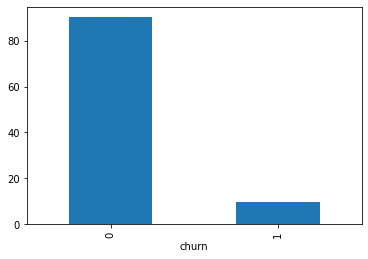

In [124]:
((all_data.groupby('churn')['churn'].count())/all_data['churn'].count().sum()*100).plot(kind = 'bar')

So truly, about 10% of the customers have churned

In [125]:
#Analysing company category activities
activity = all_data[['id', 'activity_new', 'churn']]

In [126]:
activity.head()

,id,activity_new,churn
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,0
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,1
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,0
3,764c75f661154dac3a6c254cd082ea7d,NaN,0
4,bba03439a292a1e166f80264c16191cb,NaN,0


In [127]:
activity_v = activity.groupby('activity_new')['activity_new'].count().sort_values(ascending = False)
print(activity_v)

activity_new
apdekpcbwosbxepsfxclislboipuxpop    1577
kkklcdamwfafdcfwofuscwfwadblfmce     422
kwuslieomapmswolewpobpplkaooaaew     230
fmwdwsxillemwbbwelxsampiuwwpcdcb     219
ckfxocssowaeipxueikxcmaxdmcduxsa     189
                                    ... 
fxocpcbfplipxiokscwiuexkceoucmko       1
ifdlbmlxdpwlpxkidiblliebeupwcaxu       1
iilxdefdkwudppkiekwlcexkdupeucla       1
ikiucmkuisupefxcxfxxulkpwssppfuo       1
aacewucldmklslcffeckexipaemmsdfk       1
Name: activity_new, Length: 419, dtype: int64


<AxesSubplot:xlabel='activity_new'>

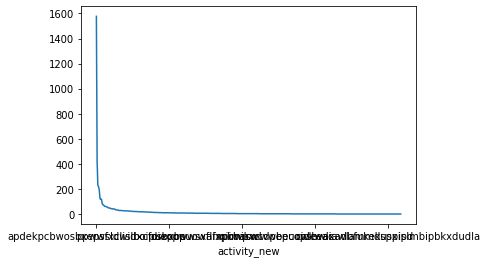

In [128]:
activity_v.plot()

So there seems to be a lot of common terms in the company category, this we can use to group the compnies 

In [129]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   channel_sales             11878 non-null  object 
 3   cons_12m                  16096 non-null  int64  
 4   cons_gas_12m              16096 non-null  int64  
 5   cons_last_month           16096 non-null  int64  
 6   date_activ                16096 non-null  object 
 7   date_end                  16094 non-null  object 
 8   date_modif_prod           15939 non-null  object 
 9   date_renewal              16056 non-null  object 
 10  forecast_cons_12m         16096 non-null  float64
 11  forecast_cons_year        16096 non-null  int64  
 12  forecast_discount_energy  15970 non-null  float64
 13  forecast_meter_rent_12m   16096 non-null  float64
 14  foreca

In [130]:
#accessing the channels
channel_group = all_data[["id","channel_sales", "churn"]]
channel_group =channel_group.groupby(['channel_sales', 'churn']).count().sort_values(by='channel_sales', ascending = False).unstack(level=1)

print(channel_group)


                                      id       
churn                                  0      1
channel_sales                                  
epumfxlbckeskwekxbiuasklxalciiuu     4.0    NaN
ewpakwlliwisiwduibdlfmalxowmwpci   884.0   82.0
fixdbufsefwooaasfcxdxadsiekoceaa     2.0    NaN
foosdfpfkusacimwkcsosbicdxkicaua  6455.0  922.0
lmkebamcaaclubfxadlmueccxoimlema  1957.0  116.0
sddiedcslfslkckwlfkdpoeeailfpeds    12.0    NaN
usilxuppasemubllopkaafesmlibmsdf  1294.0  150.0


From the data it is seen that sales channel has a huge influence on customer churn

<AxesSubplot:xlabel='channel_sales'>

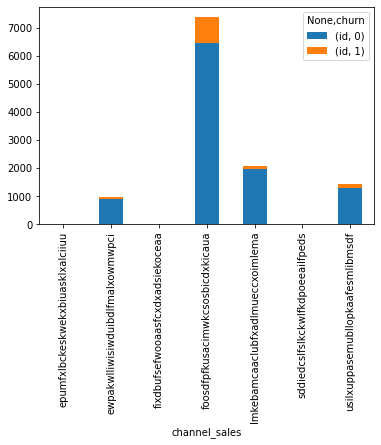

In [131]:
channel_group.plot(kind= 'bar', stacked = True)

In [132]:
#accessing the origin up
origin = all_data[["id","origin_up", "churn"]]
origin =origin.groupby(['origin_up', 'churn']).count().sort_values(by='origin_up', ascending = False).unstack(level=1)
print(origin)


                                      id        
churn                                  0       1
origin_up                                       
ewxeelcelemmiwuafmddpobolfuxioce     1.0     NaN
kamkkxfxxuwbdslkwifmmcsiusiuosws  4252.0   265.0
ldkssxwpmemidmecebumciepifcamkci  3349.0   315.0
lxidpiddsbxsbosboudacockeimpuepw  6815.0  1010.0
usapbepcfoloekilkwsdiboslwaxobdp     2.0     NaN


<AxesSubplot:xlabel='origin_up'>

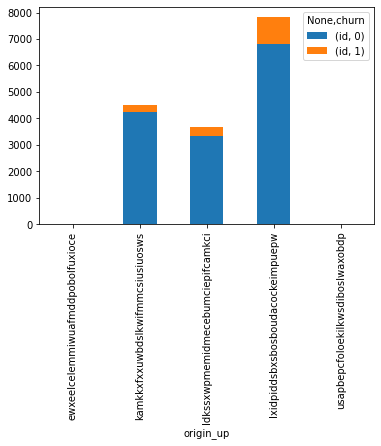

In [133]:
origin.plot(kind= 'bar', stacked = True)

Also, origin might be able to play a significant role in churning

In [134]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   channel_sales             11878 non-null  object 
 3   cons_12m                  16096 non-null  int64  
 4   cons_gas_12m              16096 non-null  int64  
 5   cons_last_month           16096 non-null  int64  
 6   date_activ                16096 non-null  object 
 7   date_end                  16094 non-null  object 
 8   date_modif_prod           15939 non-null  object 
 9   date_renewal              16056 non-null  object 
 10  forecast_cons_12m         16096 non-null  float64
 11  forecast_cons_year        16096 non-null  int64  
 12  forecast_discount_energy  15970 non-null  float64
 13  forecast_meter_rent_12m   16096 non-null  float64
 14  foreca

C:\Users\Abraham T Owos\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Abraham T Owos\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Abraham T Owos\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments

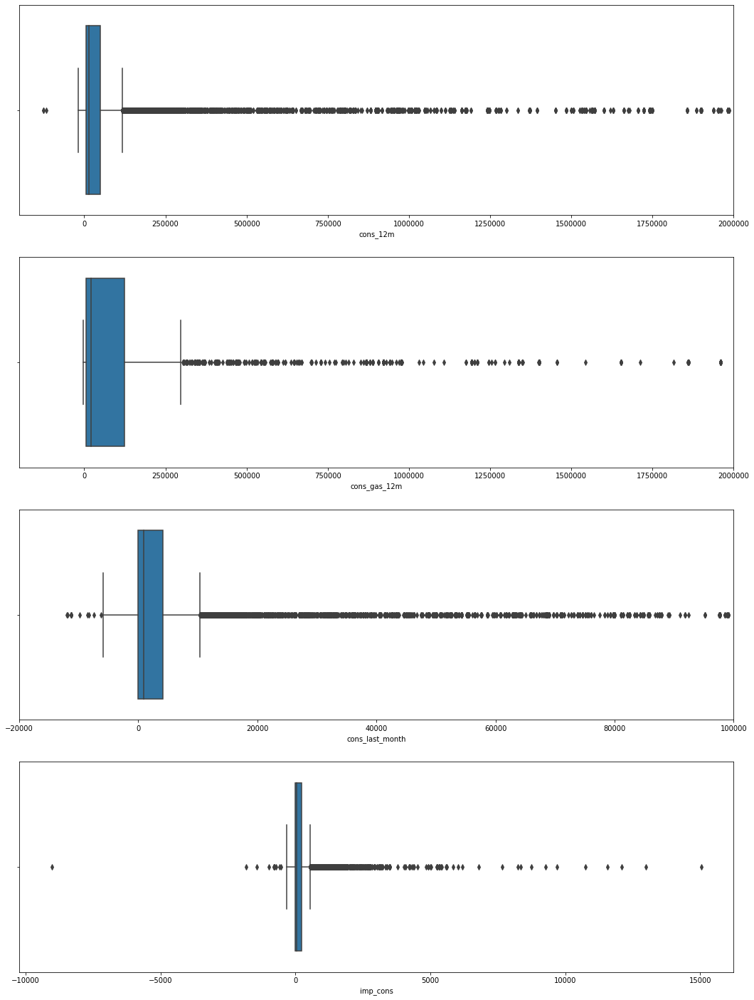

In [135]:
#visualising consumption
consumption = all_data[["id","cons_12m", "cons_gas_12m","cons_last_month", "imp_cons", "has_gas", "churn"]]

fig, axs = plt.subplots(nrows=4, figsize=(18,25))
# Plot histogram
sns.boxplot(consumption["cons_12m"], ax=axs[0])
sns.boxplot(consumption[consumption["has_gas"] == "t"]["cons_gas_12m"], ax=axs[1])
sns.boxplot(consumption["cons_last_month"], ax=axs[2])
sns.boxplot(consumption["imp_cons"], ax=axs[3])
# Remove scientific notation
for ax in axs:
 ax.ticklabel_format(style='plain', axis='x')
# Set x-axis limit
axs[0].set_xlim(-200000, 2000000)
axs[1].set_xlim(-200000, 2000000)
axs[2].set_xlim(-20000, 100000)
plt.show()

too many outliers

<AxesSubplot:>

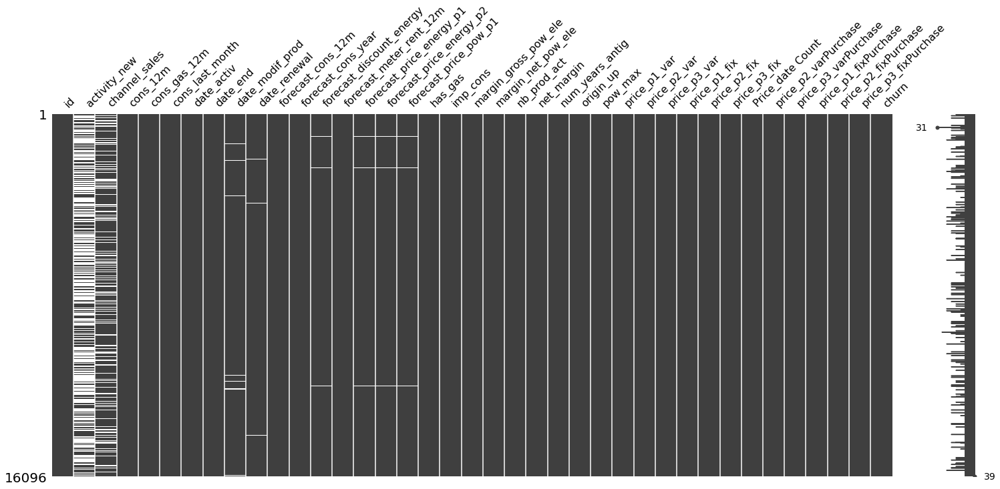

In [137]:
# creating a missingno matrix to concenptualize the level of null values

missingno.matrix(all_data)

In [ ]:
#'find correlation'
sns.pairplot(all_data[['churn', 'channel_sales', 'cons_12m', 'cons_gas_12m',
       'cons_last_month', 'date_activ', 'date_end', 'date_modif_prod',
       'date_renewal', 'forecast_cons_12m', 'forecast_cons_year',
       'forecast_discount_energy', 'forecast_meter_rent_12m',
       'forecast_price_energy_p1', 'forecast_price_energy_p2',
       'forecast_price_pow_p1']], hue='churn', size = 5)

In [138]:
all_data.head()

,id,activity_new,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,forecast_price_pow_p1,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,Price_date Count,price_p2_varPurchase,price_p3_varPurchase,price_p1_fixPurchase,price_p2_fixPurchase,price_p3_fixPurchase,churn
0,48ada52261e7cf58715202705a0451c9,esoiiifxdlbkcsluxmfuacbdckommixw,lmkebamcaaclubfxadlmueccxoimlema,309275,0,10025,2012-11-07,2016-11-06,2012-11-07,2015-11-09,26520.30,10025,0.0,359.29,0.095919,0.088347,58.995952,f,831.8,-41.76,-41.76,1,1732.36,3,ldkssxwpmemidmecebumciepifcamkci,180.000,1.241384,1.105379,0.806894,707.478018,436.282646,100.044610,12,1,1,1,1,1,0
1,24011ae4ebbe3035111d65fa7c15bc57,NaN,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,NaN,2015-06-23,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.0,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1.351412,1.123509,0.798365,447.040256,268.224124,178.816084,12,1,1,1,1,1,1
2,d29c2c54acc38ff3c0614d0a653813dd,NaN,NaN,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.0,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,1.649274,0.000000,0.000000,487.469573,0.000000,0.000000,12,0,0,1,0,0,0
3,764c75f661154dac3a6c254cd082ea7d,NaN,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.0,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,2.046140,1.061055,0.000000,532.625404,0.000000,0.000000,12,1,0,1,0,0,0
4,bba03439a292a1e166f80264c16191cb,NaN,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.0,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,1.814521,0.000000,0.000000,532.803183,0.000000,0.000000,12,0,0,1,0,0,0


In [141]:
#handling missing dates
all_data.loc[all_data["date_modif_prod"].isnull(),"date_modif_prod"] = all_data["date_modif_prod"].value_counts().index[0]
all_data.loc[all_data["date_end"].isnull(),"date_end"] = all_data["date_end"].value_counts().index[0]
all_data.loc[all_data["date_renewal"].isnull(),"date_renewal"] = all_data["date_renewal"].value_counts().index[0]


In [142]:
#checking the missing values
all_data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   channel_sales             11878 non-null  object 
 3   cons_12m                  16096 non-null  int64  
 4   cons_gas_12m              16096 non-null  int64  
 5   cons_last_month           16096 non-null  int64  
 6   date_activ                16096 non-null  object 
 7   date_end                  16096 non-null  object 
 8   date_modif_prod           16096 non-null  object 
 9   date_renewal              16096 non-null  object 
 10  forecast_cons_12m         16096 non-null  float64
 11  forecast_cons_year        16096 non-null  int64  
 12  forecast_discount_energy  15970 non-null  float64
 13  forecast_meter_rent_12m   16096 non-null  float64
 14  foreca

In [143]:
#filling up all the missing values
columns = ['forecast_cons_12m', 'forecast_cons_year',
       'forecast_discount_energy', 'forecast_meter_rent_12m',
       'forecast_price_energy_p1', 'forecast_price_energy_p2',
       'forecast_price_pow_p1', 'margin_gross_pow_ele',
       'margin_net_pow_ele', 'net_margin', 'pow_max', 'price_p1_var', 'price_p2_var',
       'price_p3_var', 'price_p1_fix', 'price_p2_fix', 'price_p3_fix']
for x in columns:
    all_data.loc[all_data[x].isnull(), x] = all_data[x].median()
    # I am filling up with median because of the excess outliers in the data

In [146]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16096 entries, 0 to 16095
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        16096 non-null  object 
 1   activity_new              6551 non-null   object 
 2   channel_sales             11878 non-null  object 
 3   cons_12m                  16096 non-null  int64  
 4   cons_gas_12m              16096 non-null  int64  
 5   cons_last_month           16096 non-null  int64  
 6   date_activ                16096 non-null  object 
 7   date_end                  16096 non-null  object 
 8   date_modif_prod           16096 non-null  object 
 9   date_renewal              16096 non-null  object 
 10  forecast_cons_12m         16096 non-null  float64
 11  forecast_cons_year        16096 non-null  float64
 12  forecast_discount_energy  16096 non-null  float64
 13  forecast_meter_rent_12m   16096 non-null  float64
 14  foreca

Now balanced

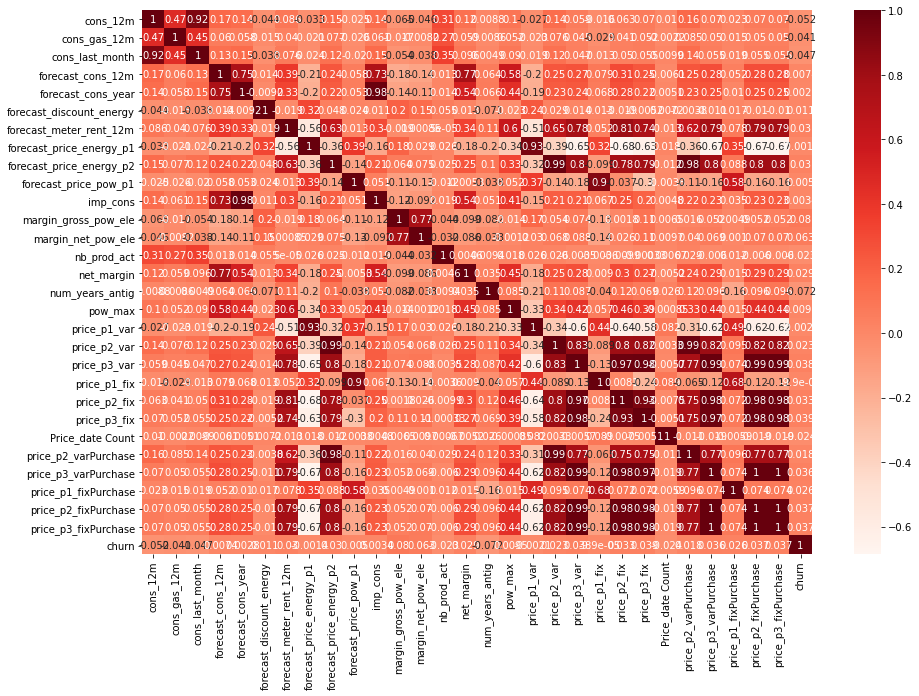

In [147]:
plt.figure(figsize=(15,10))
cor = all_data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
#with this data I can determine which columns to futher drop whenever during feature selection, like price_p3_fix and price_p2_fix, so I could drop P3_fix, same goes for p3 var and a lot others.

In [148]:
all_data.columns

Index(['id', 'activity_new', 'channel_sales', 'cons_12m', 'cons_gas_12m',
       'cons_last_month', 'date_activ', 'date_end', 'date_modif_prod',
       'date_renewal', 'forecast_cons_12m', 'forecast_cons_year',
       'forecast_discount_energy', 'forecast_meter_rent_12m',
       'forecast_price_energy_p1', 'forecast_price_energy_p2',
       'forecast_price_pow_p1', 'has_gas', 'imp_cons', 'margin_gross_pow_ele',
       'margin_net_pow_ele', 'nb_prod_act', 'net_margin', 'num_years_antig',
       'origin_up', 'pow_max', 'price_p1_var', 'price_p2_var', 'price_p3_var',
       'price_p1_fix', 'price_p2_fix', 'price_p3_fix', 'Price_date Count',
       'price_p2_varPurchase', 'price_p3_varPurchase', 'price_p1_fixPurchase',
       'price_p2_fixPurchase', 'price_p3_fixPurchase', 'churn'],
      dtype='object')

In [151]:
all_data = all_data.drop(['cons_last_month', 'forecast_cons_year', 'forecast_price_energy_p1', 'forecast_price_energy_p2', 'price_p2_varPurchase', 'price_p3_varPurchase','price_p2_fixPurchase', 'price_p3_fixPurchase', 'price_p3_fix', 'price_p3_var'], axis = 1)

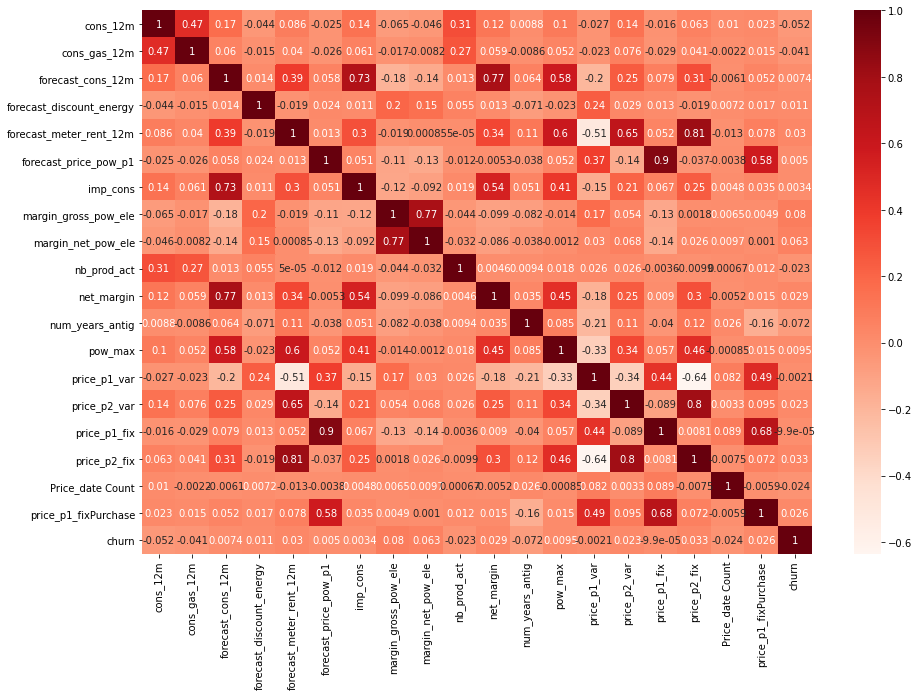

In [152]:
plt.figure(figsize=(15,10))
cor = all_data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

C:\Users\Abraham T Owos\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


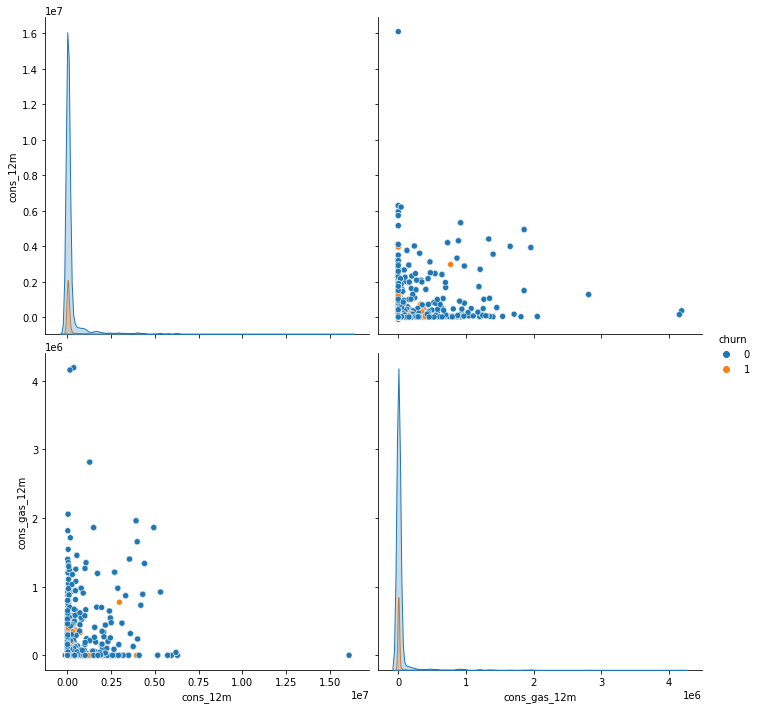

In [154]:
sns.pairplot(all_data[['id', 'churn', 'cons_12m', 'cons_gas_12m',
       'date_activ', 'date_end']], hue= 'churn', size = 5)

No useful info

In [155]:
#saving to csv
all_data.to_csv('eda.csv', index = False)